# Transfer learning to new dataset (query to reference mapping)

In this notebook, we train a DRVI model on reference data and transfer processes and embedings to a query data. DRVI uses acArches approach internally. This covers:

- Training DRVI
- Query to reference mapping
- Observe the integrated latent space in UMAP
- Observe transferred factors

## Contact

For questions and help requests, you can reach out in the [scverse discourse](https://discourse.scverse.org/).

If you found a bug, please use the [issue tracker](https://github.com/theislab/drvi/issues).

## Install

If you try DRVI on colab, next cell will install dependencies.

Please remove this part if your environment is already setup.

In [1]:
import sys

# if branch is stable, will install via pypi, else will install from source
branch = "latest"
IN_COLAB = "google.colab" in sys.modules

if IN_COLAB and branch == "stable":
    !pip install multigrate[tutorials]
elif IN_COLAB and branch != "stable":
    !pip install git+https://github.com/theislab/drvi.git#egg=drvi[tutorials]

## Imports

In [2]:
import warnings
warnings.filterwarnings("ignore")

In [3]:
import anndata as ad
import scanpy as sc

import scvi
import drvi
from pathlib import Path
from drvi.model import DRVI
from drvi.utils.misc import hvg_batch

In [4]:
print("Last run with scvi-tools version:", scvi.__version__)
print("Last run with DRVI version:", drvi.__version__)

Last run with scvi-tools version: 1.4.0.post1
Last run with DRVI version: 0.2.2


In [5]:
# Making plots prettier
sc.settings.set_figure_params(dpi=100, frameon=False)
sc.set_figure_params(dpi=100)
sc.set_figure_params(figsize=(3, 3))

from matplotlib import pyplot as plt
plt.rcParams["figure.dpi"] = 100
plt.rcParams["figure.figsize"] = (3, 3)

## Config

In [6]:
# Set this to false if you already trained your model and do not like to retrain.
overwrite = False
SEED = 1  # Set to None if you don't want to set seed

# Set input output directory to load data from and store model and embeddings there
# We use tmp_io/ directory in the same place as this notebook. Update accordingly.
io_dir = Path("./tmp_io/drvi_immune_128_q2r/")
io_dir.mkdir(parents=True, exist_ok=True)
io_dir

PosixPath('tmp_io/drvi_immune_128_q2r')

## Load Data

In [7]:
%%bash -s "$io_dir"
export io_dir=$1

# Download Example Immune dataset if it does not exist
if [ ! -f $io_dir/immune_all.h5ad ]; then
  curl -L https://figshare.com/ndownloader/files/25717328 -o $io_dir/immune_all.h5ad
  echo "File downloaded successfully."
else
  echo "File already exists."
fi

File already exists.


In [8]:
adata = sc.read_h5ad(io_dir / "immune_all.h5ad")
# Remove dataset with non-count values
adata = adata[adata.obs["batch"] != "Villani"].copy()
# We shuffle the data for better visualization. Otherwise order of points in UMAP will not be random.
sc.pp.subsample(adata, fraction=1.)
adata

AnnData object with n_obs × n_vars = 32484 × 12303
    obs: 'batch', 'chemistry', 'data_type', 'dpt_pseudotime', 'final_annotation', 'mt_frac', 'n_counts', 'n_genes', 'sample_ID', 'size_factors', 'species', 'study', 'tissue'
    layers: 'counts'

## Pre-processing

In [9]:
adata.X = adata.layers["counts"].copy()
sc.pp.normalize_total(adata)
sc.pp.log1p(adata)
adata

AnnData object with n_obs × n_vars = 32484 × 12303
    obs: 'batch', 'chemistry', 'data_type', 'dpt_pseudotime', 'final_annotation', 'mt_frac', 'n_counts', 'n_genes', 'sample_ID', 'size_factors', 'species', 'study', 'tissue'
    uns: 'log1p'
    layers: 'counts'

In [10]:
adata.obs['study'].unique()

['Oetjen', '10X', 'Sun', 'Freytag']
Categories (4, object): ['10X', 'Freytag', 'Oetjen', 'Sun']

In [11]:
# Holding out an unseed dataset as query
adata_ref = adata[adata.obs['study'] != 'Sun'].copy()
adata_query = adata[adata.obs['study'] == 'Sun'].copy()

In [12]:
# Batch aware HVG selection (method is obtained from scIB metrics)
hvg_genes = hvg_batch(adata_ref, batch_key="batch", target_genes=2000, adataOut=False)
adata_ref = adata_ref[:, hvg_genes].copy()
adata_query = adata_query[:, hvg_genes].copy()
adata_ref, adata_query

This function is obtained from scIB metrics. Please don't forget to cite them if you use it.
Using 437 HVGs from full intersect set
Using 501 HVGs from n_batch-1 set
Using 604 HVGs from n_batch-2 set
Using 458 HVGs from n_batch-3 set
Using 2000 HVGs


(AnnData object with n_obs × n_vars = 23655 × 2000
     obs: 'batch', 'chemistry', 'data_type', 'dpt_pseudotime', 'final_annotation', 'mt_frac', 'n_counts', 'n_genes', 'sample_ID', 'size_factors', 'species', 'study', 'tissue'
     uns: 'log1p'
     layers: 'counts',
 AnnData object with n_obs × n_vars = 8829 × 2000
     obs: 'batch', 'chemistry', 'data_type', 'dpt_pseudotime', 'final_annotation', 'mt_frac', 'n_counts', 'n_genes', 'sample_ID', 'size_factors', 'species', 'study', 'tissue'
     uns: 'log1p'
     layers: 'counts')

In [13]:
# Save pre-processes data for next notebooks
if overwrite or not (io_dir / "adata_preprocesses_ref.h5ad").exists():
    adata_ref.write_h5ad(io_dir / "adata_preprocesses_ref.h5ad")
if overwrite or not (io_dir / "adata_preprocesses_query.h5ad").exists():
    adata_query.write_h5ad(io_dir / "adata_preprocesses_query.h5ad")

In [14]:
del adata

## Train DRVI

In [15]:
# You can also skip this cell if model is already trained

# Setup data
DRVI.setup_anndata(
    adata_ref,
    layer="counts",
    batch_key="batch",
    # In addition to batch_key, you can also provide additional `categorical_covariate_keys`.
    # DRVI supports query to reference mapping with new categorical covatiates.
    is_count_data=True,
)

# Setting seed (set to None if you don't want to fix seed)
scvi.settings.seed = SEED

# construct the model
model = DRVI(
    adata_ref,
    n_latent=128,
    # IMPORTANT: you need to allow encoder to get covatiates as input to be able to do query to reference mapping
    encode_covariates=True,
    # For encoder and decoder dims, provide a list of integers.
    encoder_dims=[128, 128],
    decoder_dims=[128, 128],
    # dispersion='gene-batch',  # depending on the variability of gene dispersions use 'gene' or 'gene-batch'
)
model

[rank: 0] Seed set to 1


INFO     DRVI: The model has been initialized                                                                      


DRVI 
Latent size: 128, splits: 128, pooling of splits: 'logsumexp', 
Encoder dims: [128, 128], 
Decoder dims: [128, 128], 
Gene likelihood: pnb, 

Training status: Not Trained

In [16]:
n_epochs = 400
model_path = io_dir / "drvi_model"

# train the model and save (if not already trained)
if overwrite or not model_path.exists():
    model.train(
        max_epochs=n_epochs,
        early_stopping=False,
        early_stopping_patience=20,
        # No need to provide `plan_kwargs` if n_epochs >= 400.
        plan_kwargs={
            "n_epochs_kl_warmup": n_epochs,
        },
    )
    
    # Save the model
    model.save(model_path, overwrite=True)

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
You are using a CUDA device ('NVIDIA H100 80GB HBM3') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Epoch 400/400: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 400/400 [06:58<00:00,  1.04s/it, v_num=1, train_loss=823]

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 400/400 [06:58<00:00,  1.05s/it, v_num=1, train_loss=823]


## Get reference embeddings

In [17]:
# Load the model
model = DRVI.load(model_path, adata_ref)
model

INFO     File tmp_io/drvi_immune_128_q2r/drvi_model/model.pt already downloaded                                    
INFO     DRVI: The model is trained with DRVI version 0.2.2.                                                       
INFO     DRVI: Updaging data setup config ...                                                                      
INFO     DRVI: Done updating data source registry. Loading in DRVI version 0.2.2.                                  
INFO     DRVI: Loading model from DRVI version 0.2.2.                                                              
INFO     DRVI: Done updating model args. Loading in 0.2.2.                                                         
INFO     DRVI: The model has been initialized                                                                      


DRVI 
Latent size: 128, splits: 128, pooling of splits: 'logsumexp', 
Encoder dims: [128, 128], 
Decoder dims: [128, 128], 
Gene likelihood: pnb, 

Training status: Trained

In [18]:
embed_ref = ad.AnnData(model.get_latent_representation(adata_ref), obs=adata_ref.obs)
drvi.utils.tl.set_latent_dimension_stats(model, embed_ref, vanished_threshold=0.1)
embed_ref.write_h5ad(io_dir / "embed_ref.h5ad")

If you are interested to observe your latent space and latent factors of the reference model, please have a look at the main tutorial.

## Transfer learning

In [19]:
model_path = io_dir / "drvi_model_transfer"
if overwrite or not model_path.exists():
    drvi.model.DRVI.prepare_query_anndata(adata_query, model)
    model_transfer = drvi.model.DRVI.load_query_data(adata_query, model)
    
    # It is important to pass plan_kwargs={"weight_decay": 0.0} to make sure reference embeddings are untouched
    model_transfer.train(
        max_epochs=100, 
        plan_kwargs={
            "weight_decay": 0.0,
        }
    )
    model_transfer.save(model_path, overwrite=True)

model_transfer = DRVI.load(model_path, adata_query)

INFO     Found 100.0% reference vars in query data.                                                                
INFO     DRVI: The model is trained with DRVI version 0.2.2.                                                       
INFO     DRVI: Updaging data setup config ...                                                                      
INFO     DRVI: Done updating data source registry. Loading in DRVI version 0.2.2.                                  
INFO     DRVI: The model is trained with DRVI version 0.2.2.                                                       
INFO     DRVI: Updaging data setup config ...                                                                      
INFO     DRVI: Done updating data source registry. Loading in DRVI version 0.2.2.                                  
INFO     DRVI: Loading model from DRVI version 0.2.2.                                                              
INFO     DRVI: Done updating model args. Loading in 0.2.2.              

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Resizing z_encoder.encoder.fc_layers.Layer 0.0.weight from torch.Size([128, 2005]) to torch.Size([128, 2009])
Resizing decoder.px_shared_decoder.fc_layers.Layer 0.0.weight from torch.Size([128, 133]) to torch.Size([128, 137])
Freezing key z_encoder.encoder.fc_layers.Layer 0.0.bias
Freezing key z_encoder.encoder.fc_layers.Layer 1.0.weight
Freezing key z_encoder.encoder.fc_layers.Layer 1.0.bias
Freezing key z_encoder.mean_encoder.fc_layers.Layer 0.0.weight
Freezing key z_encoder.mean_encoder.fc_layers.Layer 0.0.bias
Freezing key z_encoder.var_encoder.fc_layers.Layer 0.0.weight
Freezing key z_encoder.var_encoder.fc_layers.Layer 0.0.bias
Freezing key decoder.split_transformation_weight
Freezing key decoder.px_shared_decoder.fc_layers.Layer 0.0.bias
Freezing key decoder.px_shared_decoder.fc_layers.Layer 1.0.weight
Freezing key decoder.px_shared_decoder.fc_layers.Layer 1.0.bias
Freezing key decoder.params_nets.r
Freezing key decoder.params_nets.mean.fc_layers.Layer 0.0.weight
Freezing key de

`Trainer.fit` stopped: `max_epochs=100` reached.


Epoch 100/100: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [00:37<00:00,  2.69it/s, v_num=1, train_loss=577]
INFO     File tmp_io/drvi_immune_128_q2r/drvi_model_transfer/model.pt already downloaded                           
INFO     DRVI: The model is trained with DRVI version 0.2.2.                                                       
INFO     DRVI: Updaging data setup config ...                                                                      
INFO     DRVI: Done updating data source registry. Loading in DRVI version 0.2.2.                                  
INFO     DRVI: Loading model from DRVI version 0.2.2.                                                              
INFO     DRVI: Done updating model args. Loading in 0.2.2.                                                         
INFO     DRVI: The model has been initialized                       

## Latent space

In [20]:
embed_path = io_dir / "embed.h5ad"

# Create latent space data in anndata format
if overwrite or not embed_path.exists():
    embed_ref = sc.read_h5ad(io_dir / "embed_ref.h5ad")  # Reference
    embed_query = ad.AnnData(model_transfer.get_latent_representation(), obs=adata_query.obs)  # Query

    # Combining the two
    embed_ref.obs['split'] = 'reference'
    embed_query.obs['split'] = 'query'
    embed = ad.concat([embed_ref, embed_query], join='outer')
    embed.var = embed_ref.var.copy()

    sc.pp.neighbors(embed, n_neighbors=10, use_rep="X", n_pcs=embed.X.shape[1])
    sc.tl.umap(embed, spread=1.0, min_dist=0.5, random_state=123)
    sc.pp.pca(embed)
    
    embed.write_h5ad(embed_path)
embed

AnnData object with n_obs × n_vars = 32484 × 128
    obs: 'batch', 'chemistry', 'data_type', 'dpt_pseudotime', 'final_annotation', 'mt_frac', 'n_counts', 'n_genes', 'sample_ID', 'size_factors', 'species', 'study', 'tissue', '_scvi_batch', '_scvi_labels', 'split'
    var: 'original_dim_id', 'reconstruction_effect', 'order', 'max_value', 'mean', 'min', 'max', 'std', 'std_abs', 'title', 'vanished'
    uns: 'neighbors', 'umap', 'pca'
    obsm: 'X_umap', 'X_pca'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [21]:
embed = sc.read_h5ad(embed_path)

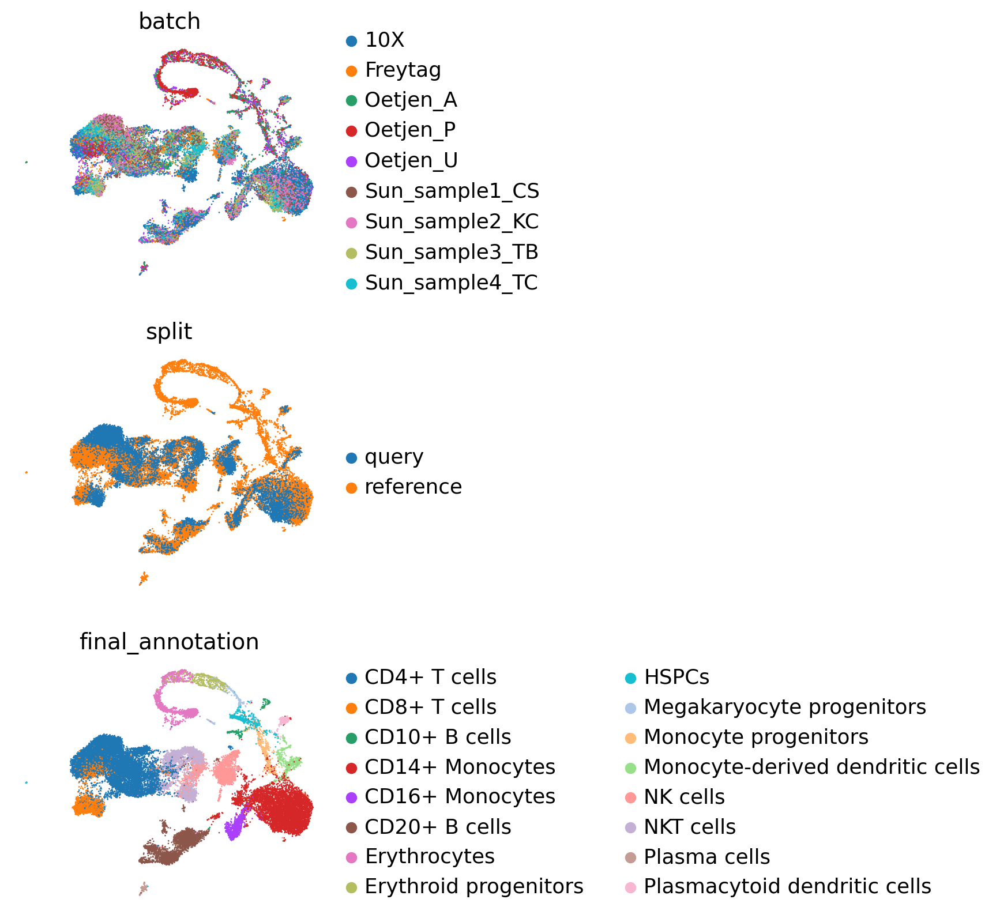

In [22]:
sc.pl.umap(embed, color=["batch", "split", "final_annotation"], ncols=1, frameon=False)

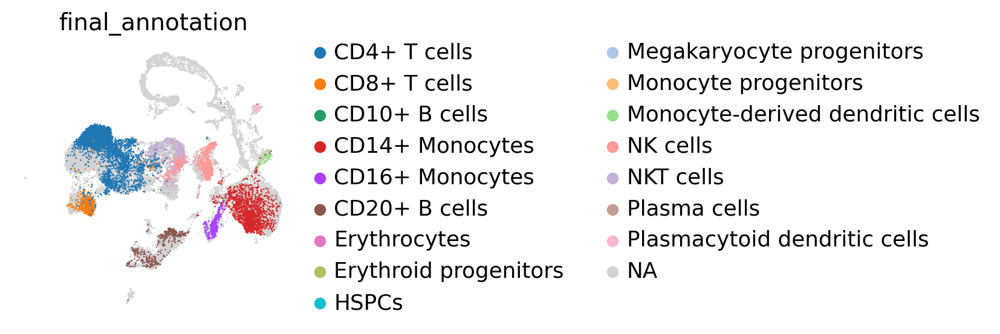

In [23]:
sc.pl.umap(embed, mask_obs=embed.obs['split']=='query', color=["final_annotation"], ncols=1, frameon=False)

### Plot latent dimensions

By default, vanished dimensions are not plotted. Change arguments if you would like to.

#### UMAP of factors for all cells

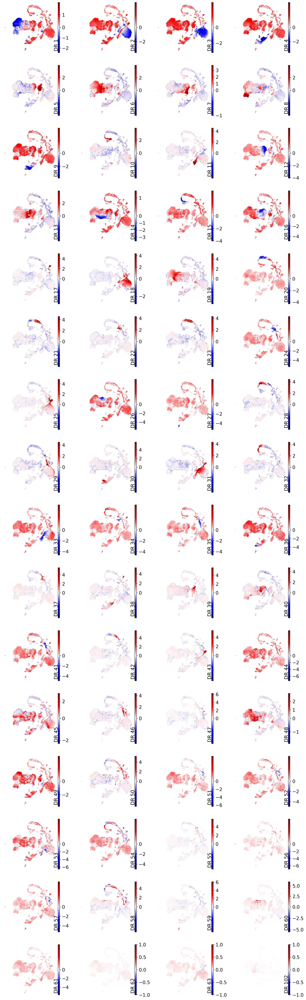

In [24]:
drvi.utils.pl.plot_latent_dims_in_umap(embed)

#### UMAP of factors for query cells

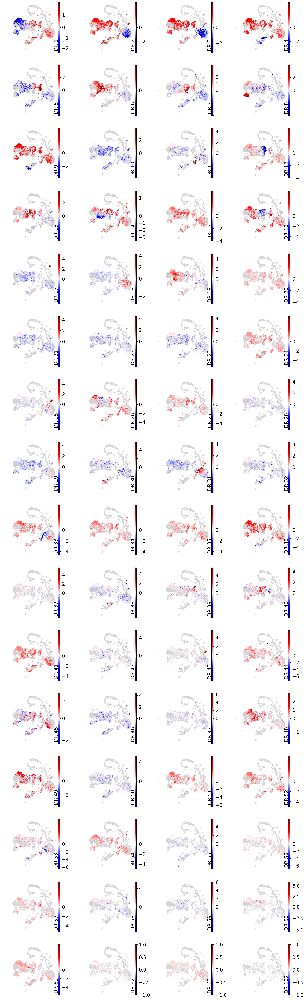

In [25]:
drvi.utils.pl.plot_latent_dims_in_umap(
    embed,
    mask_obs=embed.obs['split']=='query',
)

#### Heatmaps

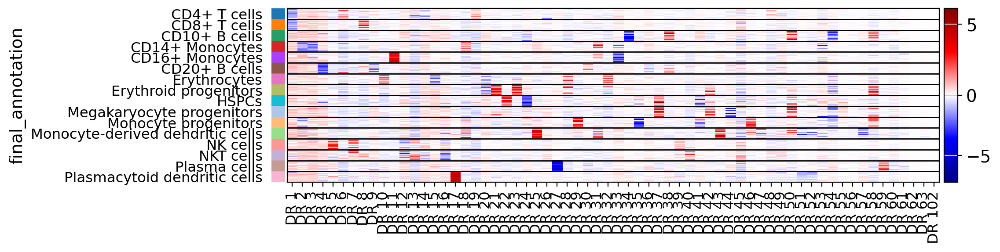

In [26]:
drvi.utils.pl.plot_latent_dims_in_heatmap(embed_ref, "final_annotation", title_col="title")

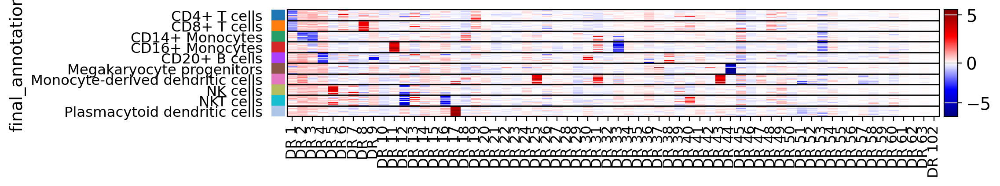

In [27]:
embed_query.var = embed_ref.var.copy()
drvi.utils.pl.plot_latent_dims_in_heatmap(embed_query, "final_annotation", title_col="title")